# Modeling Stage

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import plotly.graph_objects as go
import plotly.express as px
import joblib
import os

os.makedirs('models', exist_ok=True)

pd.options.display.float_format = '{:.4f}'.format

data = "preprocessed.csv"

df_model = pd.read_csv(data,low_memory=False)

df_model.head(10)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,dti_winsorized,revol_util_winsorized,revol_bal_winsorized,open_acc_winsorized,total_acc_winsorized,mort_acc_winsorized,log_annual_inc,has_pub_rec,sub_grade_num,credit_age_months
0,12000.0000,36,0.0797,375.8800,A,A5,associate,10+ years,OWN,42000.0000,...,27.7400,0.3700,11457.0000,9.0000,16.0000,0.0000,10.6454,0,5,294
1,10000.0000,36,0.0944,320.0500,B,B1,Therapist,3 years,MORTGAGE,55000.0000,...,18.7900,0.5750,7188.0000,7.0000,10.0000,2.0000,10.9151,0,6,183
2,8000.0000,36,0.1602,281.3400,C,C5,Owner,< 1 year,MORTGAGE,120000.0000,...,20.3600,0.9230,19015.0000,8.0000,34.0000,6.0000,11.6953,0,15,315
3,12800.0000,36,0.1359,434.9300,C,C2,Area Director,5 years,RENT,90000.0000,...,22.6300,0.8600,12660.0000,10.0000,23.0000,0.0000,11.4076,0,12,384
4,15000.0000,36,0.1359,509.6900,C,C2,Realtor,4 years,MORTGAGE,180000.0000,...,38.0700,0.6660,101097.0000,24.0000,50.0000,4.0000,12.1007,0,12,528
5,40000.0000,60,0.0797,810.4900,A,A5,Software Developer,10+ years,OWN,200000.0000,...,14.3700,0.1310,10478.0000,25.0000,61.0000,6.0000,12.2061,0,5,196
6,18000.0000,60,0.1602,437.9200,C,C5,Licensed Insurance Manager,< 1 year,RENT,125000.0000,...,9.5300,0.3490,17983.0000,14.0000,31.0000,0.0000,11.7361,0,15,171
7,2000.0000,36,0.2388,78.3400,E,E2,NaN,NaN,RENT,24000.0000,...,42.2000,0.7010,7221.0000,7.0000,16.0000,1.0000,10.0859,0,22,229
8,16000.0000,60,0.1709,398.4200,D,D1,City carrier assistant,< 1 year,RENT,60000.0000,...,24.7200,0.8500,31095.0000,15.0000,33.0000,0.0000,11.0021,0,16,208
9,2000.0000,36,0.1359,67.9600,C,C2,Network Architect 3,< 1 year,MORTGAGE,125000.0000,...,6.5300,0.7840,1803.0000,5.0000,12.0000,0.0000,11.7361,0,12,186


In [2]:
 # Imports

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier


from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, cross_val_predict


from sklearn.metrics import (
    roc_auc_score, accuracy_score, f1_score,
    recall_score, precision_score, roc_curve,
    confusion_matrix, classification_report,
    average_precision_score, precision_recall_curve, 
    auc, log_loss, brier_score_loss
)

from sklearn.isotonic import IsotonicRegression
from sklearn.calibration import calibration_curve

import shap


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# SPLIT - ENCODE - SCALING
from sklearn.preprocessing import OneHotEncoder, StandardScaler

numeric_features = [
    'loan_amnt', 'term', 'dti_winsorized',
    'revol_util_winsorized', 'revol_bal_winsorized', 'open_acc_winsorized',
    'mort_acc_winsorized', 'log_annual_inc', 'has_pub_rec',
    'credit_age_months', 'sub_grade_num'
]

onehot_cols = ['home_ownership', 'verification_status', 'purpose', 'addr_state']

X = df_model[numeric_features + onehot_cols]
y = df_model['loan_status']

# 1. Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# 2. Encode (fit on train only)
encoder = OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)
train_ohe = encoder.fit_transform(X_train[onehot_cols])
test_ohe = encoder.transform(X_test[onehot_cols])
ohe_cols = encoder.get_feature_names_out(onehot_cols)

# 3. Scale (fit on train only)
scaler = StandardScaler()
train_num = scaler.fit_transform(X_train[numeric_features])
test_num = scaler.transform(X_test[numeric_features])

# 4. Reassemble
X_train = pd.DataFrame(np.hstack([train_num, train_ohe]),
                        columns=numeric_features + list(ohe_cols), index=X_train.index)
X_test = pd.DataFrame(np.hstack([test_num, test_ohe]),
                       columns=numeric_features + list(ohe_cols), index=X_test.index)


In [4]:
# Imbalance handling setup
# class_weight='balanced' for LR/DT/RF; scale_pos_weight for XGBoost

neg, pos = np.bincount(y_train)
scale_pos_weight = neg / pos
print(f"scale_pos_weight (XGBoost): {scale_pos_weight:.4f}")

 

scale_pos_weight (XGBoost): 3.9888


In [5]:
# helper function for metrics printing

def print_metrics(y_true, proba, pred, model_name):
    """Compute metrics, print them, plot confusion matrix, return results dict."""
    roc_auc = roc_auc_score(y_true, proba)
    accuracy = accuracy_score(y_true, pred)
    f1 = f1_score(y_true, pred)
    recall = recall_score(y_true, pred)
    precision = precision_score(y_true, pred)
    ap = average_precision_score(y_true,proba)
 
    print(f"\n=== {model_name} ===")
    print(f"Accuracy:  {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1:        {f1:.4f}")
    print(f"ROC-AUC:   {roc_auc:.4f}")
    print(f"AP:    {ap:4f}")
 
    print(f"\nClassification Report — {model_name}")
    print(classification_report(y_true, pred, target_names=['No Default', 'Default']))
 
    cm = confusion_matrix(y_true, pred)
    plt.figure(figsize=(4, 3.5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['No Default', 'Default'],
                yticklabels=['No Default', 'Default'])
    plt.xlabel('Predicted'); plt.ylabel('Actual')
    plt.title(f'Confusion Matrix — {model_name}')
    plt.tight_layout(); plt.show()
 
    return {'Model': model_name, 'Accuracy': accuracy, 'Precision': precision,
            'Recall': recall, 'F1': f1, 'ROC-AUC': roc_auc, 'AP': ap}
 
results = []

 

In [ ]:
# 1. LOGISTIC REGRESSION 

lr_model = LogisticRegression(
    penalty='l2',
    C=1.0,
    class_weight='balanced',
    solver='lbfgs',
    max_iter=1000,
    random_state=42
)

lr_model.fit(X_train, y_train)


# load model
# lr_model = joblib.load('models/lr_model.pkl')


lr_proba = lr_model.predict_proba(X_test)[:, 1]
lr_pred = lr_model.predict(X_test)
results.append(print_metrics(y_test, lr_proba, lr_pred, 'Logistic Regression'))


# joblib.dump(lr_model, 'models/lr_model.pkl')

 

In [ ]:
# 1.2 LOGISTIC REGRESSION (tuned)

param_grid = {
    'penalty':['l2'],
    'C':[0.001, 0.01, 0.1, 1],
    'class_weight': ['balanced'],
    'solver': ['lbfgs'],
    'max_iter': [1000]
}

gridsearch = GridSearchCV(
    estimator = lr_model,
    param_grid = param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

gridsearch.fit(X_train, y_train)
lr_best = gridsearch.best_estimator_
print("\nBest parameters:")
print(gridsearch.best_params_)
print("Best CV ROC-AUC:")
print(gridsearch.best_score_)


# load model
# lr_best = joblib.load('models/lr_best.pkl')


lr_best_proba = lr_best.predict_proba(X_test)[:, 1]
lr_best_pred = lr_best.predict(X_test)
results.append(print_metrics(y_test,lr_best_proba,lr_best_pred,'Logistic Regression (Tuned)'))


# save model
# joblib.dump(lr_best, 'models/lr_best.pkl') 


In [ ]:
# 2.1 DECISION TREE

dt_model = DecisionTreeClassifier(
    criterion='gini',
    max_depth=5,
    min_samples_split=2,
    min_samples_leaf=10,
    class_weight='balanced',
    random_state=42
)

# train
dt_model.fit(X_train, y_train)


# load instead of training
# dt_model = joblib.load('models/dt_model.pkl')


dt_proba = dt_model.predict_proba(X_test)[:, 1]
dt_pred = dt_model.predict(X_test)
results.append(print_metrics(y_test, dt_proba, dt_pred, 'Decision Tree'))


# joblib.dump(dt_model, 'models/dt_model.pkl')
 

In [ ]:
# 2.2 DECISION TREE (tuned)

param_grid = {
    'criterion': ['gini'],
    'max_depth': [9],
    'min_samples_split': [2, 10, 25, 50],
    'min_samples_leaf': [75, 100, 125],
    'class_weight': ['balanced'],
    'random_state': [42]
}

'''
Best parameters:
{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 125, 'min_samples_split': 2, 'random_state': 42}
Best CV ROC-AUC:
0.7016956088837862
'''


gridsearch_dt = GridSearchCV(
    estimator=dt_model,
    param_grid=param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)


# train
gridsearch_dt.fit(X_train, y_train)
dt_best = gridsearch_dt.best_estimator_
print("\nBest parameters:")
print(gridsearch_dt.best_params_)
print("Best CV ROC-AUC:")
print(gridsearch_dt.best_score_)


# load instead of training
# dt_best = joblib.load('models/dt_best.pkl')


dt_best_proba = dt_best.predict_proba(X_test)[:, 1]
dt_best_pred = dt_best.predict(X_test)
results.append(print_metrics(y_test,dt_best_proba,dt_best_pred,'Decision Tree (Tuned)'))


# joblib.dump(dt_best, 'models/dt_best.pkl')

In [ ]:
# 3.1 RANDOM FOREST

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=3,
    min_samples_split=2,
    min_samples_leaf=10,
    max_features='sqrt',
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)


# train
rf_model.fit(X_train, y_train)


# load instead of training
# rf_model = joblib.load('models/rf_model.pkl')


rf_proba = rf_model.predict_proba(X_test)[:, 1]
rf_pred = rf_model.predict(X_test)
results.append(print_metrics(y_test, rf_proba, rf_pred, 'Random Forest'))


# joblib.dump(rf_model, 'models/rf_model.pkl')
 

In [ ]:
# 3.2 RANDOM FOREST (tuned)

rf_model = RandomForestClassifier(
    random_state=42,
    n_jobs=-1
)

param_distributions = {
    'n_estimators': randint(100, 300),
    'max_depth': [8, 10, 12, 15, 20, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [2, 4, 6, 10, 15],
    'max_features': ['sqrt', 'log2', None],
    'class_weight': ['balanced']
}

randomsearch_rf = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=param_distributions,
    n_iter=30,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1,
    random_state=42
)


# train
randomsearch_rf.fit(X_train, y_train)
rf_best = randomsearch_rf.best_estimator_
print("\nBest parameters:")
print(randomsearch_rf.best_params_)
print("Best CV ROC-AUC:")
print(randomsearch_rf.best_score_)


# load instead of training
# rf_best = joblib.load('models/rf_best.pkl')


rf_best_proba = rf_best.predict_proba(X_test)[:, 1]
rf_best_pred = rf_best.predict(X_test)
results.append(print_metrics(y_test, rf_best_proba, rf_best_pred, 'Random Forest (Tuned)'))


# joblib.dump(rf_best, 'models/rf_best.pkl')


In [ ]:
# 4.1 XGBOOST

xgb_model = XGBClassifier(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.1,
    subsample=1.0,
    colsample_bytree=1.0,
    scale_pos_weight=scale_pos_weight,
    eval_metric='auc',
    random_state=42,
    n_jobs=-1
)

# train
xgb_model.fit(X_train, y_train)


# load model 
# xgb_model = joblib.load('models/xgb_model.pkl')


xgb_proba = xgb_model.predict_proba(X_test)[:, 1]
xgb_pred = xgb_model.predict(X_test)
results.append(print_metrics(y_test, xgb_proba, xgb_pred, 'XGBoost'))


# joblib.dump(xgb_model, 'models/xgb_model.pkl')
 

In [ ]:
# XGBOOST (tuned)

xgb_model = XGBClassifier(
    objective='binary:logistic',
    eval_metric='auc',
    scale_pos_weight=scale_pos_weight,
    random_state=42,
    n_jobs=-1
)

param_distributions = {
    'n_estimators': randint(200, 500),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.02, 0.18),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3),
    'min_child_weight': randint(1, 10),
    'gamma': uniform(0, 0.5),
    'reg_alpha': uniform(0, 1),
    'reg_lambda': uniform(1, 4)
}

randomsearch_xgb = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_distributions,
    n_iter=25,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1,
    random_state=42
)

# train 
randomsearch_xgb.fit(X_train, y_train)
xgb_best = randomsearch_xgb.best_estimator_
print("\nBest parameters:")
print(randomsearch_xgb.best_params_)
print("Best CV ROC-AUC:")
print(randomsearch_xgb.best_score_)


# load instead of fit
# xgb_best = joblib.load('models/xgb_best.pkl')


xgb_best_proba = xgb_best.predict_proba(X_test)[:, 1]
xgb_best_pred = xgb_best.predict(X_test)
results.append(print_metrics(y_test,xgb_best_proba,xgb_best_pred,'XGBoost (Tuned)'))


# joblib.dump(xgb_best, 'models/xgb_best.pkl')

In [ ]:
# load all models
results = []


lr_model = joblib.load('models/lr_model.pkl')
lr_proba = lr_model.predict_proba(X_test)[:, 1]
lr_pred = lr_model.predict(X_test)
results.append(print_metrics(y_test, lr_proba, lr_pred, 'Logistic Regression'))


lr_best = joblib.load('models/lr_best.pkl')
lr_best_proba = lr_best.predict_proba(X_test)[:, 1]
lr_best_pred = lr_best.predict(X_test)
results.append(print_metrics(y_test,lr_best_proba,lr_best_pred,'Logistic Regression (Tuned)'))


dt_model = joblib.load('models/dt_model.pkl')
dt_proba = dt_model.predict_proba(X_test)[:, 1]
dt_pred = dt_model.predict(X_test)
results.append(print_metrics(y_test, dt_proba, dt_pred, 'Decision Tree'))


dt_best = joblib.load('models/dt_best.pkl')
dt_best_proba = dt_best.predict_proba(X_test)[:, 1]
dt_best_pred = dt_best.predict(X_test)
results.append(print_metrics(y_test, dt_best_proba, dt_best_pred, 'Decision Tree (Tuned)'))


rf_model = joblib.load('models/rf_model.pkl')
rf_proba = rf_model.predict_proba(X_test)[:, 1]
rf_pred = rf_model.predict(X_test)
results.append(print_metrics(y_test, rf_proba, rf_pred, 'Random Forest'))


rf_best = joblib.load('models/rf_best.pkl')
rf_best_proba = rf_best.predict_proba(X_test)[:, 1]
rf_best_pred = rf_best.predict(X_test)
results.append(print_metrics(y_test, rf_best_proba, rf_best_pred, 'Random Forest (Tuned)'))


xgb_model = joblib.load('models/xgb_model.pkl')
xgb_proba = xgb_model.predict_proba(X_test)[:, 1]
xgb_pred = xgb_model.predict(X_test)
results.append(print_metrics(y_test, xgb_proba, xgb_pred, 'XGBoost'))


xgb_best = joblib.load('models/xgb_best.pkl')
xgb_best_proba = xgb_best.predict_proba(X_test)[:, 1]
xgb_best_pred = xgb_best.predict(X_test)
results.append(print_metrics(y_test,xgb_best_proba,xgb_best_pred,'XGBoost (Tuned)'))


#10.6s loading time

# Evaluation

In [7]:
# COMPARISON TABLE

results_df = pd.DataFrame(results).sort_values('ROC-AUC', ascending=False).reset_index(drop=True)
print("\n=== Model Comparison ===")
results_df


=== Model Comparison ===


,Model,Accuracy,Precision,Recall,F1,ROC-AUC,AP
0,XGBoost (Tuned),0.6490,0.3214,0.6760,0.4357,0.7194,0.3878
1,XGBoost,0.6488,0.3211,0.6750,0.4352,0.7187,0.3873
2,Random Forest (Tuned),0.7210,0.3625,0.5165,0.4260,0.7148,0.3797
3,Logistic Regression (Tuned),0.6597,0.3229,0.6361,0.4284,0.7078,0.3704
4,Logistic Regression,0.6598,0.3229,0.6358,0.4283,0.7078,0.3704
5,Decision Tree (Tuned),0.6284,0.3065,0.6765,0.4219,0.7029,0.3642
6,Decision Tree,0.6328,0.3075,0.6643,0.4204,0.6965,0.3457
7,Random Forest,0.6294,0.3058,0.6684,0.4196,0.6934,0.3524


In [ ]:
# ROC CURVES — ALL MODELS ON ONE GRAPH

models = {
    'Logistic Regression': lr_model,
    'Logistic Regression (Tuned)': lr_best,
    'Decision Tree': dt_model,
    'Decision Tree (Tuned)': dt_best,
    'Random Forest': rf_model,
    'Random Forest (Tuned)': rf_best,
    'XGBoost': xgb_model,
    'XGBoost (Tuned)': xgb_best
}

model_auc = {}

for model_name, model in models.items():
    y_proba = model.predict_proba(X_test)[:, 1]
    model_auc[model_name] = roc_auc_score(y_test, y_proba)

models = dict(
    sorted(
        models.items(),
        key=lambda x: model_auc[x[0]],
        reverse=True
    )
)

# Create one figure
fig = go.Figure()

for model_name, model in models.items():

    # Calculate probabilities
    y_proba = model.predict_proba(X_test)[:, 1]

    # Calculate ROC + thresholds
    fpr, tpr, thresholds = roc_curve(y_test, y_proba)

    # Calculate AUC
    auc = roc_auc_score(y_test, y_proba)

    # Add ROC curve
    fig.add_trace(go.Scatter(
        x=fpr,
        y=tpr,
        mode='lines',
        name=f'{model_name} (AUC = {auc:.4f})',

        # Store threshold for hover
        customdata=thresholds.reshape(-1, 1),

        hovertemplate=(
            '<b>%{fullData.name}</b><br>'
            'Threshold: %{customdata[0]:.4f}<br>'
            'False Positive Rate: %{x:.4f}<br>'
            'True Positive Rate: %{y:.4f}'
            '<extra></extra>'
        )
    ))


# RANDOM CLASSIFIER
fig.add_trace(go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    name='Random Classifier',
    hoverinfo='skip',
    line=dict(dash='dash')
))

# LAYOUT
fig.update_layout(
    title='ROC Curves — Model Comparison',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',

    width=1000,
    height=700,

    hovermode='closest',

    legend=dict(
        title='Models',
        x=1.02,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

fig.show()

In [ ]:
# PRECISION-RECALL CURVES — ALL MODELS ON ONE GRAPH (takes 80 MB)

models = {
    'Logistic Regression': lr_model,
    'Logistic Regression (Tuned)': lr_best,
    'Decision Tree': dt_model,
    'Decision Tree (Tuned)': dt_best,
    'Random Forest': rf_model,
    'Random Forest (Tuned)': rf_best,
    'XGBoost': xgb_model,
    'XGBoost (Tuned)': xgb_best
}

model_ap = {}

for model_name, model in models.items():
    y_proba = model.predict_proba(X_test)[:, 1]
    model_ap[model_name] = average_precision_score(y_test, y_proba)

models = dict(
    sorted(
        models.items(),
        key=lambda x: model_ap[x[0]],
        reverse=True
    )
)

# Create ONE figure
fig = go.Figure()

# Baseline = proportion of positive class
baseline = y_test.mean()

for model_name, model in models.items():

    # Get probability of Default (class = 1)
    y_proba = model.predict_proba(X_test)[:, 1]

    # Calculate Precision-Recall curve
    precision, recall, thresholds = precision_recall_curve(
        y_test,
        y_proba
    )

    # Calculate Average Precision (PR-AUC)
    ap = average_precision_score(
        y_test,
        y_proba
    )

    # Add PR curve
    fig.add_trace(go.Scatter(
        x=recall,
        y=precision,
        mode='lines',
        name=f'{model_name} (AP = {ap:.4f})',

        # Thresholds are one element shorter than precision/recall
        customdata=list(thresholds) + [None],

        hovertemplate=(
            '<b>%{fullData.name}</b><br>'
            'Threshold: %{customdata:.4f}<br>'
            'Recall: %{x:.4f}<br>'
            'Precision: %{y:.4f}'
            '<extra></extra>'
        )
    ))


# BASELINE
fig.add_hline(
    y=baseline,
    line_dash='dash',
    annotation_text=f'Baseline = {baseline:.4f}',
    annotation_position='bottom right'
)

# LAYOUT
fig.update_layout(
    title='Precision-Recall Curves — Model Comparison',
    xaxis_title='Recall',
    yaxis_title='Precision',

    width=1000,
    height=700,

    hovermode='closest',

    legend=dict(
        title='Models',
        x=1.02,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

fig.show()

# Calibration

## isotonic method

In [14]:
# OOF PREDICTIONS — TUNED XGBOOST

cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

xgb_oof_proba = cross_val_predict(
    xgb_best,
    X_train,
    y_train,
    cv=cv,
    method='predict_proba',
    n_jobs=1
)[:, 1]

print("OOF probabilities generated.")
print("Shape:", xgb_oof_proba.shape)

OOF probabilities generated.
Shape: (1305891,)


In [15]:
# Fit calibrator using OOF predictions
isotonic = IsotonicRegression(out_of_bounds='clip')
isotonic.fit(xgb_oof_proba, y_train)

# Calibrated OOF probabilities
xgb_oof_calibrated = isotonic.predict(xgb_oof_proba)

In [19]:
xgb_test_proba = xgb_best.predict_proba(X_test)[:, 1]
xgb_test_calibrated = isotonic.predict(xgb_test_proba)

print("Brier Before:", brier_score_loss(y_train, xgb_oof_proba))
print("Brier After: ", brier_score_loss(y_train, xgb_oof_calibrated),'\n')
print("Raw mean PD:", xgb_test_proba.mean())
print("Calibrated mean PD:", xgb_test_calibrated.mean())
print("Actual Default Rate:", y_train.mean())

Brier Before: 0.21467178661232603
Brier After:  0.14440956994391496 

Raw mean PD: 0.45561835
Calibrated mean PD: 0.20096542
Actual Default Rate: 0.2004501141366316


In [22]:
xgb_test_proba = xgb_best.predict_proba(X_test)[:, 1]
xgb_test_calibrated = isotonic.predict(xgb_test_proba)
print("Brier Before:", brier_score_loss(y_test, xgb_test_proba))
print("Brier After: ", brier_score_loss(y_test, xgb_test_calibrated))
print()
print("Raw mean PD:", xgb_test_proba.mean())
print("Calibrated mean PD:", xgb_test_calibrated.mean())
print("Actual Default Rate:", y_train.mean())

Brier Before: 0.2144512317117853
Brier After:  0.1439948664211202

Raw mean PD: 0.45561835
Calibrated mean PD: 0.20096542
Actual Default Rate: 0.2004501141366316


In [17]:
print("TEST Brier Before:", brier_score_loss(y_test, xgb_test_proba))
print("TEST Brier After: ", brier_score_loss(y_test, xgb_test_calibrated))

print("\nTEST ROC-AUC Before:", roc_auc_score(y_test, xgb_test_proba))
print("TEST ROC-AUC After: ", roc_auc_score(y_test, xgb_test_calibrated))

TEST Brier Before: 0.2144512317117853
TEST Brier After:  0.1439948664211202

TEST ROC-AUC Before: 0.7194185243128958
TEST ROC-AUC After:  0.7193835304789018


In [ ]:
joblib.dump(isotonic,'models/xgb_isotonic.pkl')

In [ ]:
# Calibration curves
raw_true, raw_pred = calibration_curve(
    y_test, xgb_test_proba, n_bins=10, strategy="quantile"
)

iso_true, iso_pred = calibration_curve(
    y_test, xgb_test_calibrated, n_bins=10, strategy="quantile"
)

fig = go.Figure()

# Perfect calibration
fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1],
    mode="lines",
    name="Perfect Calibration",
    line=dict(dash="dash")
))

# Raw XGBoost
fig.add_trace(go.Scatter(
    x=raw_pred, y=raw_true,
    mode="lines+markers",
    name="Raw XGBoost"
))

# Isotonic
fig.add_trace(go.Scatter(
    x=iso_pred, y=iso_true,
    mode="lines+markers",
    name="Isotonic"
))

fig.update_layout(
    title="XGBoost Probability Calibration — Test Set",
    xaxis_title="Mean Predicted Probability",
    yaxis_title="Observed Default Rate",
    xaxis=dict(range=[0, 1]),
    yaxis=dict(range=[0, 1]),
    width=900,
    height=650
)

fig.show()

In [ ]:
# Fit LR's own isotonic calibrator (out-of-fold, mirrors the XGBoost cell above)
lr_oof_proba = cross_val_predict(
    lr_best, X_train, y_train,
    cv=cv, method='predict_proba', n_jobs=1
)[:, 1]

lr_isotonic = IsotonicRegression(out_of_bounds='clip')
lr_isotonic.fit(lr_oof_proba, y_train)

joblib.dump(lr_isotonic, 'models/lr_isotonic.pkl')

# Apply it to the held-out test set
lr_test_proba = lr_best.predict_proba(X_test)[:, 1]
lr_test_calibrated = lr_isotonic.predict(lr_test_proba)

# Calibration curves
raw_true, raw_pred = calibration_curve(
    y_test, lr_test_proba, n_bins=10, strategy="quantile"
)

iso_true, iso_pred = calibration_curve(
    y_test, lr_test_calibrated, n_bins=10, strategy="quantile"
)

fig = go.Figure()

# Perfect calibration
fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1],
    mode="lines",
    name="Perfect Calibration",
    line=dict(dash="dash")
))

# Raw Logistic Regression
fig.add_trace(go.Scatter(
    x=raw_pred, y=raw_true,
    mode="lines+markers",
    name="Raw Logistic Regression"
))

# Isotonic
fig.add_trace(go.Scatter(
    x=iso_pred, y=iso_true,
    mode="lines+markers",
    name="Isotonic"
))

fig.update_layout(
    title="Logistic Regression Probability Calibration — Test Set",
    xaxis_title="Mean Predicted Probability",
    yaxis_title="Observed Default Rate",
    xaxis=dict(range=[0, 1]),
    yaxis=dict(range=[0, 1]),
    width=900,
    height=650
)

fig.show()

In [24]:
print("Brier Before:", brier_score_loss(y_test, lr_test_proba))
print("Brier After: ", brier_score_loss(y_test, lr_test_calibrated))
print()
print("Raw mean PD:", lr_test_proba.mean())
print("Calibrated mean PD:", lr_test_calibrated.mean())
print("Actual Default Rate:", y_train.mean())

Brier Before: 0.21773889461642046
Brier After:  0.14587799100791693

Raw mean PD: 0.46252978134050937
Calibrated mean PD: 0.20082778672864138
Actual Default Rate: 0.2004501141366316


# Threshold Selection

In [32]:
# ROC using OOF predictions
fpr, tpr, thresholds = roc_curve(y_train, xgb_oof_proba)

roc_auc = roc_auc_score(y_train, xgb_oof_proba)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=fpr,
    y=tpr,
    mode='lines',
    name=f'ROC curve (AUC = {roc_auc:.4f})',
    customdata=thresholds,
    hovertemplate=
        'FPR: %{x:.4f}<br>' +
        'TPR: %{y:.4f}<br>' +
        'Threshold: %{customdata:.4f}' +
        '<extra></extra>'
))

fig.add_trace(go.Scatter(
    x=[0, 1],
    y=[0, 1],
    mode='lines',
    line=dict(dash='dash'),
    name='Random'
))

fig.update_layout(
    title=f'OOF ROC Curve — Tuned & Calibrated XGBoost (AUC = {roc_auc:.4f})',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    xaxis=dict(range=[0, 1]),
    yaxis=dict(range=[0, 1]),
    hovermode='closest'
)

fig.show()

In [36]:
data = df_model.loc[y_test.index]

non_default = data.loc[y_test == 0]
defaulted = data.loc[y_test == 1]

total_interest = (
    non_default['installment'] * non_default['term']
    - non_default['loan_amnt']
).sum()

LGD = 0.45

default_loss = (
    defaulted['loan_amnt'] * LGD
).sum()

net_value = total_interest - default_loss

print(f"Test contractual interest: RM {total_interest:,.2f}")
print(f"Test estimated default loss: RM {default_loss:,.2f}")
print(f"Test net financial value: RM {net_value:,.2f}")

Test contractual interest: RM 1,004,145,620.40
Test estimated default loss: RM 471,706,368.75
Test net financial value: RM 532,439,251.65


In [ ]:

# FINANCIAL THRESHOLD OPTIMIZATION

LGDs = np.arange(0.62, 0.68, 0.01)

financial_train = df_model.loc[X_train.index]

thresholds = np.linspace(
    xgb_oof_calibrated.min(),
    xgb_oof_calibrated.max(),
    100
)

results = []

for lgd in LGDs:

    for threshold in thresholds:

        pred = (xgb_oof_calibrated >= threshold).astype(int)

        fp = (pred == 1) & (y_train == 0)
        fn = (pred == 0) & (y_train == 1)

        fp_cost = (
            financial_train.loc[fp, 'term']
            * financial_train.loc[fp, 'installment']
            - financial_train.loc[fp, 'loan_amnt']
        ).sum()

        fn_cost = (
            financial_train.loc[fn, 'loan_amnt'] * lgd
        ).sum()

        results.append({
            'LGD': lgd,
            'Threshold': threshold,
            'FP_Cost': fp_cost,
            'FN_Cost': fn_cost,
            'Total_Cost': fp_cost + fn_cost,
            'FP_Count': fp.sum(),
            'FN_Count': fn.sum()
        })

results = pd.DataFrame(results)


# INTERACTIVE GRAPH
fig = go.Figure()

for i, lgd in enumerate(LGDs):

    data = results[results.LGD == lgd]
    best = data.loc[data.Total_Cost.idxmin()]

    visible = (i == 0)

    # FP COST
    fig.add_trace(go.Scatter(
        x=data.Threshold,
        y=data.FP_Cost,
        mode='lines',
        name='FP Cost',
        visible=visible,
        customdata=data[['FP_Count']],
        hovertemplate=
            'Threshold: %{x:.4f}<br>' +
            'FP Cost: RM %{y:,.0f}<br>' +
            'FP Count: %{customdata[0]:,}<extra></extra>'
    ))

    # FN COST
    fig.add_trace(go.Scatter(
        x=data.Threshold,
        y=data.FN_Cost,
        mode='lines',
        name='FN Cost',
        visible=visible,
        customdata=data[['FN_Count']],
        hovertemplate=
            'FN Cost: RM %{y:,.0f}<br>' +
            'FN Count: %{customdata[0]:,}<extra></extra>'
    ))

    # TOTAL COST
    fig.add_trace(go.Scatter(
        x=data.Threshold,
        y=data.Total_Cost,
        mode='lines',
        name='Total Cost',
        visible=visible,
        line=dict(width=3),
        hovertemplate=
            'Total Cost: RM %{y:,.0f}<extra></extra>'
    ))

    # OPTIMAL POINT
    fig.add_trace(go.Scatter(
        x=[best.Threshold],
        y=[best.Total_Cost],
        mode='markers+text',
        text=[f"Optimal = {best.Threshold:.3f}"],
        textposition='top center',
        name='Optimal Threshold',
        visible=visible,
        marker=dict(size=10),
        hovertemplate=
            'Optimal Threshold: %{x:.4f}<br>' +
            'Total Cost: RM %{y:,.0f}<br>' +
            f'FP Count: {best.FP_Count:,}<br>' +
            f'FN Count: {best.FN_Count:,}<extra></extra>'
    ))


# LGD DROPDOWN
buttons = []

for i, lgd in enumerate(LGDs):

    visible = [False] * (len(LGDs) * 4)
    visible[i * 4:i * 4 + 4] = [True] * 4

    buttons.append(dict(
        label=f"LGD {lgd:.0%}",
        method="update",
        args=[
            {"visible": visible},
            {
                "title":
                    f"Financial Cost vs Calibrated PD Threshold "
                    f"(LGD = {lgd:.0%})"
            }
        ]
    ))


fig.update_layout(
    title=f"Financial Cost vs Calibrated PD Threshold "
          f"(LGD = {LGDs[0]:.0%})",

    xaxis_title="Calibrated PD Threshold",

    yaxis_title="Financial Cost (RM)",

    hovermode="x unified",

    updatemenus=[dict(
        buttons=buttons,
        direction="down",
        showactive=True,
        x=1,
        xanchor="right",
        y=1.15
    )]
)

fig.show()

In [ ]:
# INTERACTIVE THRESHOLD ANALYSIS
LGD = 0.63

thresholds = np.linspace(
    xgb_oof_calibrated.min(),
    xgb_oof_calibrated.max(),
    500
)

# BUILD COST/METRIC TABLE DIRECTLY AT THIS LGD
rows = []

for threshold in thresholds:

    pred = (xgb_oof_calibrated >= threshold).astype(int)

    fp = (pred == 1) & (y_train == 0)
    fn = (pred == 0) & (y_train == 1)

    fp_cost = (
        financial_train.loc[fp, 'term']
        * financial_train.loc[fp, 'installment']
        - financial_train.loc[fp, 'loan_amnt']
    ).sum()

    fn_cost = (
        financial_train.loc[fn, 'loan_amnt'] * LGD
    ).sum()

    rows.append(dict(
        Threshold=threshold,
        FP_Cost=fp_cost,
        FN_Cost=fn_cost,
        Total_Cost=fp_cost + fn_cost,
        FP_Count=int(fp.sum()),
        FN_Count=int(fn.sum()),
        Accuracy=accuracy_score(y_train, pred),
        Precision=precision_score(y_train, pred, zero_division=0),
        Recall=recall_score(y_train, pred, zero_division=0),
        F1=f1_score(y_train, pred, zero_division=0),
    ))

data = pd.DataFrame(rows)

fig = go.Figure()

# COST CURVES
fig.add_trace(go.Scatter(
    x=data['Threshold'],
    y=data['FP_Cost'],
    mode='lines',
    name='FP Cost'
))

fig.add_trace(go.Scatter(
    x=data['Threshold'],
    y=data['FN_Cost'],
    mode='lines',
    name='FN Cost'
))

fig.add_trace(go.Scatter(
    x=data['Threshold'],
    y=data['Total_Cost'],
    mode='lines',
    name='Total Cost',
    line=dict(width=3)
))

# OPTIMAL POINT
best = data.loc[data['Total_Cost'].idxmin()]

fig.add_trace(go.Scatter(
    x=[best['Threshold']],
    y=[best['Total_Cost']],
    mode='markers+text',
    text=[f"Optimal = {best['Threshold']:.3f}"],
    textposition='top center',
    name='Optimal Threshold',
    marker=dict(size=10, symbol='star'),
    hovertemplate=
        'Optimal Threshold: %{x:.4f}<br>' +
        'Total Cost: $ %{y:,.0f}<br>' +
        f"FP Count: {best['FP_Count']:,}<br>" +
        f"FN Count: {best['FN_Count']:,}<extra></extra>"
))

# SLIDER STEPS — reuse the rows already computed above, no recomputation
steps = []

for row in data.itertuples():

    steps.append(dict(
        method="relayout",
        args=[{
            "title.text":
                f"Financial Cost vs Threshold "
                f"(LGD = {LGD:.0%}, Threshold = {row.Threshold:.4f})",

            "annotations": [{
                "x": 1.15,
                "y": 0.5,
                "xref": "paper",
                "yref": "paper",
                "showarrow": False,
                "align": "left",
                "text": (
                    f"<b>Threshold:</b> {row.Threshold:.4f}<br><br>"
                    f"<b>Accuracy:</b> {row.Accuracy:.3f}<br>"
                    f"<b>Precision:</b> {row.Precision:.3f}<br>"
                    f"<b>Recall:</b> {row.Recall:.3f}<br>"
                    f"<b>F1:</b> {row.F1:.3f}<br><br>"
                    f"<b>FP Count:</b> {row.FP_Count:,}<br>"
                    f"<b>FN Count:</b> {row.FN_Count:,}<br><br>"
                    f"<b>FP Cost:</b> $ {row.FP_Cost:,.0f}<br>"
                    f"<b>FN Cost:</b> $ {row.FN_Cost:,.0f}<br>"
                    f"<b>Total Cost:</b> $ {row.Total_Cost:,.0f}"
                )
            }]
        }]
    ))

# SLIDER
fig.update_layout(

    title=(
        f"Financial Cost vs Threshold "
        f"(LGD = {LGD:.0%})"
    ),

    xaxis_title="Calibrated PD Threshold",
    yaxis_title="Financial Cost ($)",

    hovermode="x unified",

    margin=dict(r=300),

    sliders=[dict(
        active=0,
        currentvalue={
            "prefix": "Threshold: "
        },
        steps=steps
    )]
)

fig.show()

In [ ]:
# INTERACTIVE THRESHOLD ANALYSIS
LGD = 0.63

thresholds = np.linspace(
    xgb_oof_calibrated.min(),
    xgb_oof_calibrated.max(),
    500
)

# BUILD COST/METRIC TABLE DIRECTLY AT THIS LGD
rows = []

for threshold in thresholds:

    pred = (xgb_oof_calibrated >= threshold).astype(int)

    fp = (pred == 1) & (y_train == 0)
    fn = (pred == 0) & (y_train == 1)

    fp_cost = (
        financial_train.loc[fp, 'term']
        * financial_train.loc[fp, 'installment']
        - financial_train.loc[fp, 'loan_amnt']
    ).sum()

    fn_cost = (
        financial_train.loc[fn, 'loan_amnt'] * LGD
    ).sum()

    rows.append(dict(
        Threshold=threshold,
        FP_Cost=fp_cost,
        FN_Cost=fn_cost,
        Total_Cost=fp_cost + fn_cost,
        FP_Count=int(fp.sum()),
        FN_Count=int(fn.sum()),
        Accuracy=accuracy_score(y_train, pred),
        Precision=precision_score(y_train, pred, zero_division=0),
        Recall=recall_score(y_train, pred, zero_division=0),
        F1=f1_score(y_train, pred, zero_division=0),
    ))

data = pd.DataFrame(rows)

fig = go.Figure()

# COST CURVES
fig.add_trace(go.Scatter(
    x=data['Threshold'],
    y=data['FP_Cost'],
    mode='lines',
    name='FP Cost'
))

fig.add_trace(go.Scatter(
    x=data['Threshold'],
    y=data['FN_Cost'],
    mode='lines',
    name='FN Cost'
))

fig.add_trace(go.Scatter(
    x=data['Threshold'],
    y=data['Total_Cost'],
    mode='lines',
    name='Total Cost',
    line=dict(width=3)
))

# OPTIMAL POINT (min total cost)
best = data.loc[data['Total_Cost'].idxmin()]

fig.add_trace(go.Scatter(
    x=[best['Threshold']],
    y=[best['Total_Cost']],
    mode='markers+text',
    text=[f"Cost-optimal = {best['Threshold']:.3f}"],
    textposition='top center',
    name='Cost-Optimal Threshold',
    marker=dict(size=10, symbol='star', color='mediumpurple'),
    hovertemplate=
        'Cost-Optimal Threshold: %{x:.4f}<br>' +
        'Total Cost: $ %{y:,.0f}<br>' +
        f"FP Count: {best['FP_Count']:,}<br>" +
        f"FN Count: {best['FN_Count']:,}<extra></extra>"
))

# F1-OPTIMAL POINT (max F1 score)
f1_best = data.loc[data['F1'].idxmax()]

fig.add_trace(go.Scatter(
    x=[f1_best['Threshold']],
    y=[f1_best['Total_Cost']],
    mode='markers+text',
    text=[f"F1-optimal = {f1_best['Threshold']:.3f}"],
    textposition='bottom center',
    name='F1-Optimal Threshold',
    marker=dict(size=10, symbol='star', color='gold'),
    hovertemplate=
        'F1-Optimal Threshold: %{x:.4f}<br>' +
        'Total Cost: $ %{y:,.0f}<br>' +
        f"F1 Score: {f1_best['F1']:.3f}<br>" +
        f"Recall: {f1_best['Recall']:.3f}<extra></extra>"
))

# SLIDER STEPS — reuse the rows already computed above, no recomputation
steps = []

for row in data.itertuples():

    steps.append(dict(
        method="relayout",
        args=[{
            "title.text":
                f"Financial Cost vs Threshold "
                f"(LGD = {LGD:.0%}, Threshold = {row.Threshold:.4f})",

            "annotations": [{
                "x": 1.15,
                "y": 0.5,
                "xref": "paper",
                "yref": "paper",
                "showarrow": False,
                "align": "left",
                "text": (
                    f"<b>Threshold:</b> {row.Threshold:.4f}<br><br>"
                    f"<b>Accuracy:</b> {row.Accuracy:.3f}<br>"
                    f"<b>Precision:</b> {row.Precision:.3f}<br>"
                    f"<b>Recall:</b> {row.Recall:.3f}<br>"
                    f"<b>F1:</b> {row.F1:.3f}<br><br>"
                    f"<b>FP Count:</b> {row.FP_Count:,}<br>"
                    f"<b>FN Count:</b> {row.FN_Count:,}<br><br>"
                    f"<b>FP Cost:</b> $ {row.FP_Cost:,.0f}<br>"
                    f"<b>FN Cost:</b> $ {row.FN_Cost:,.0f}<br>"
                    f"<b>Total Cost:</b> $ {row.Total_Cost:,.0f}"
                )
            }]
        }]
    ))

# SLIDER
fig.update_layout(

    title=(
        f"Financial Cost vs Threshold "
        f"(LGD = {LGD:.0%})"
    ),

    xaxis_title="Calibrated PD Threshold",
    yaxis_title="Financial Cost ($)",

    hovermode="x unified",

    margin=dict(r=300),

    sliders=[dict(
        active=0,
        currentvalue={
            "prefix": "Threshold: "
        },
        steps=steps
    )]
)

fig.show()


=== XGBoost Tuned — Custom Threshold 0.4163 ===
Accuracy:  0.7998
Precision: 0.5018
Recall:    0.1666
F1:        0.2502
ROC-AUC:   0.7194
AP:    0.385191

Classification Report — XGBoost Tuned — Custom Threshold 0.4163
              precision    recall  f1-score   support

  No Default       0.82      0.96      0.88    261032
     Default       0.50      0.17      0.25     65441

    accuracy                           0.80    326473
   macro avg       0.66      0.56      0.57    326473
weighted avg       0.76      0.80      0.76    326473



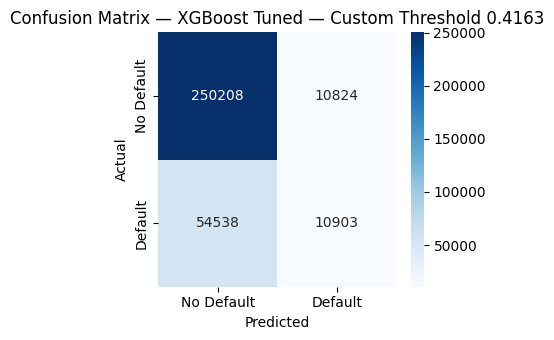

{'Model': 'XGBoost Tuned — Custom Threshold 0.4163',
 'Accuracy': 0.7997935510746678,
 'Precision': 0.5018180144520642,
 'Recall': 0.16660808972968016,
 'F1': 0.2501606093979442,
 'ROC-AUC': 0.7193835304789018,
 'AP': 0.3851911378040523}

In [48]:
# Set any threshold manually and view the performance
custom_threshold = 0.4163 # Change this to whatever value you want to test

y_pred_custom = (xgb_test_calibrated >= custom_threshold).astype(int)

print_metrics(
    y_test,
    xgb_test_calibrated,
    y_pred_custom,
    f'XGBoost Tuned — Custom Threshold {custom_threshold}'
)

In [31]:
data = df_model.loc[y_test.index]

non_default = data.loc[y_test == 0]
defaulted = data.loc[y_test == 1]

total_interest = (
    non_default['installment'] * non_default['term']
    - non_default['loan_amnt']
).sum()

LGD = 0.45

default_loss = (
    defaulted['loan_amnt'] * LGD
).sum()

net_value = total_interest - default_loss

print(f"Test contractual interest: RM {total_interest:,.2f}")
print(f"Test estimated default loss: RM {default_loss:,.2f}")
print(f"Test net financial value: RM {net_value:,.2f}")

Test contractual interest: RM 1,004,145,620.40
Test estimated default loss: RM 471,706,368.75
Test net financial value: RM 532,439,251.65


# Feature Importance

In [25]:
# XGBOOST FEATURE IMPORTANCE — GAIN

xgb_best = joblib.load('models/xgb_best.pkl')

importance = pd.Series(
    xgb_best.feature_importances_,
    index=X_test.columns,
    name="Importance"
).sort_values(ascending=False).head(15)

importance = importance.sort_values(ascending=True)

fig = px.bar(
    importance,
    x="Importance",
    y=importance.index,
    orientation="h",
    text="Importance",
    title="Top 15 XGBoost Features — Gain Importance"
)

fig.update_traces(
    texttemplate="%{text:.4f}",
    textposition="outside"
)

fig.update_layout(
    xaxis_title="Gain Importance",
    yaxis_title="Feature",
    yaxis=dict(categoryorder="array", categoryarray=importance.index),
    template="plotly_white",
    height=600,
    showlegend=False
)

fig.show()

# SHAP

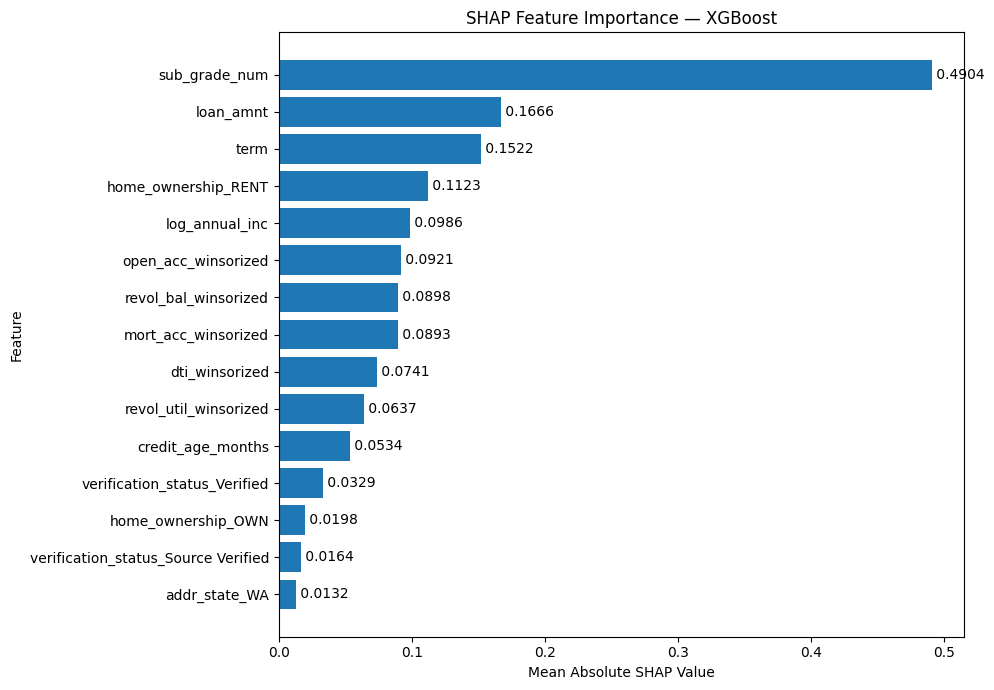

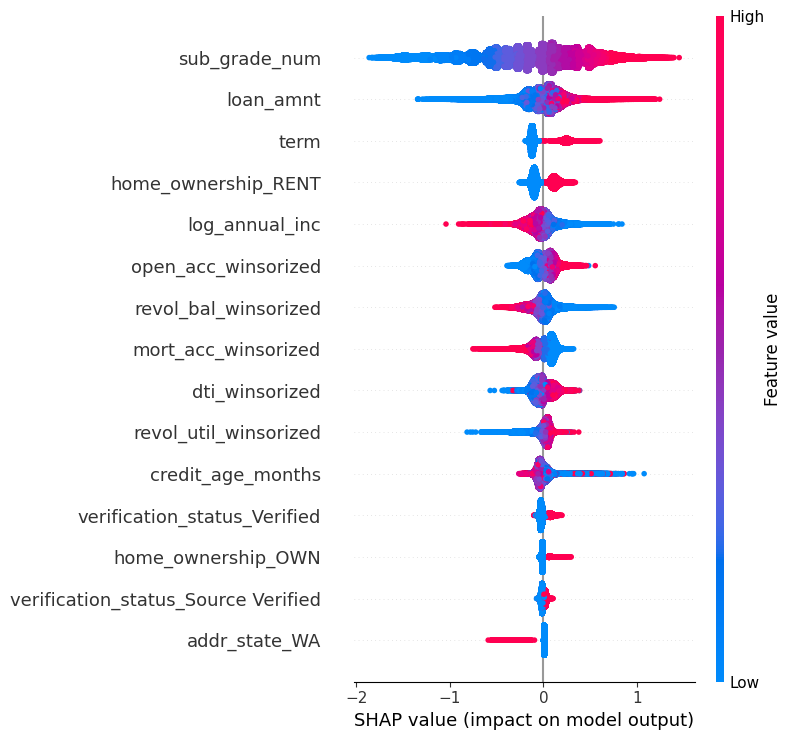


Top 3 SHAP Features:
['sub_grade_num', 'loan_amnt', 'term']


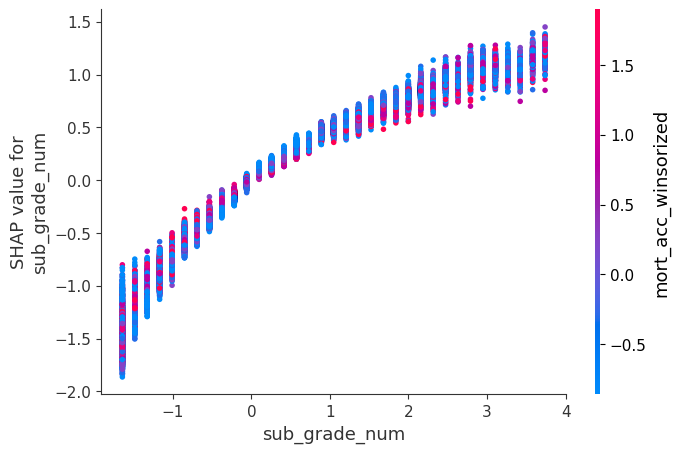

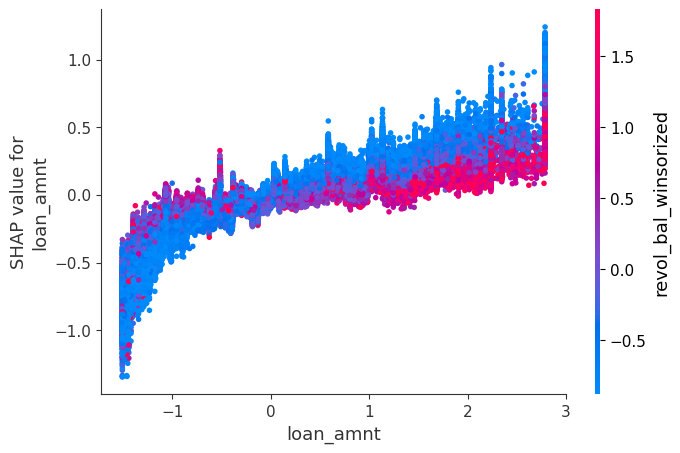

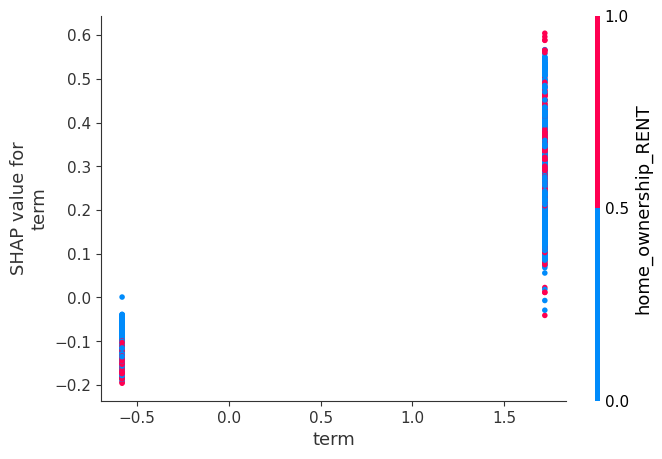

In [9]:
# SHAP ANALYSIS — FINAL XGBOOST MODEL

# Use final tuned XGBoost
final_model = xgb_best

# Create SHAP explainer
explainer = shap.TreeExplainer(final_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)


# 1. SHAP FEATURE IMPORTANCE — BAR CHART WITH VALUES

feature_importance = (
    pd.DataFrame({
        'Feature': X_test.columns,
        'Mean Absolute SHAP': np.abs(shap_values).mean(axis=0)
    })
    .sort_values('Mean Absolute SHAP', ascending=True)
)

# Top 15 features
top_n = 15
plot_data = feature_importance.tail(top_n)

plt.figure(figsize=(10, 7))

bars = plt.barh(
    plot_data['Feature'],
    plot_data['Mean Absolute SHAP']
)

# Add value labels
for bar in bars:
    value = bar.get_width()

    plt.text(
        value,
        bar.get_y() + bar.get_height() / 2,
        f' {value:.4f}',
        va='center',
        fontsize=10
    )

plt.xlabel('Mean Absolute SHAP Value')
plt.ylabel('Feature')
plt.title('SHAP Feature Importance — XGBoost')

plt.tight_layout()
plt.show()


# 2. SHAP BEESWARM
shap.summary_plot(
    shap_values,
    X_test,
    max_display=15
)



# 3. TOP 3 FEATURE DEPENDENCE PLOTS
feature_importance = pd.DataFrame({
    'Feature': X_test.columns,
    'Mean Absolute SHAP': np.abs(shap_values).mean(axis=0)
}).sort_values(
    'Mean Absolute SHAP',
    ascending=False
)

top_features = feature_importance.head(3)['Feature'].tolist()

print("\nTop 3 SHAP Features:")
print(top_features)

for feature in top_features:

    shap.dependence_plot(
        feature,
        shap_values,
        X_test
    )

BORROWER-LEVEL PREDICTION
Actual outcome:       No Default
Raw XGBoost PD:       0.1054 (10.54%)
Calibrated PD:        0.0252 (2.52%)
Decision threshold:   0.3333
Predicted outcome:    No Default


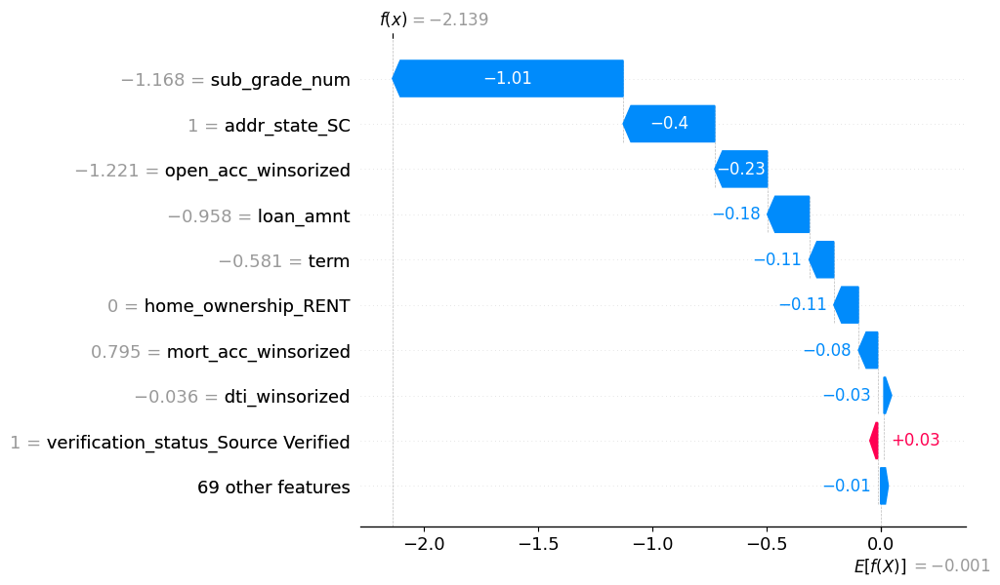

,Value
loan_amnt,35000.0000
term,60
int_rate,0.1942
installment,916.0300
grade,D
sub_grade,D3
emp_title,Warehouse Manager
emp_length,3 years
home_ownership,RENT
annual_inc,45000.0000


In [47]:
# SHAP WATERFALL — INDIVIDUAL BORROWER

sample_idx =  255290

# Get this borrower's features
X_sample = X_test.iloc[[sample_idx]]

# Raw XGBoost probability
raw_pd = xgb_best.predict_proba(X_sample)[:, 1][0]

# Calibrated probability
calibrated_pd = isotonic.predict([raw_pd])[0]

# Actual outcome
actual = y_test.loc[X_sample.index].iloc[0]

# Predicted class using your chosen threshold
threshold = 0.4163
predicted = int(calibrated_pd >= threshold)

print("============================================")
print("BORROWER-LEVEL PREDICTION")
print("============================================")

print(f"Actual outcome:       {'Default' if actual == 1 else 'No Default'}")
print(f"Raw XGBoost PD:       {raw_pd:.4f} ({raw_pd:.2%})")
print(f"Calibrated PD:        {calibrated_pd:.4f} ({calibrated_pd:.2%})")
print(f"Decision threshold:   {threshold:.4f}")
print(f"Predicted outcome:    {'Default' if predicted == 1 else 'No Default'}")

# SHAP waterfall
shap_explanation = shap.Explanation(
    values=shap_values[sample_idx],
    base_values=explainer.expected_value,
    data=X_test.iloc[sample_idx],
    feature_names=X_test.columns
)

shap.plots.waterfall(
    shap_explanation,
    max_display=10
)

display(df_model.loc[sample_idx].to_frame("Value"))

In [ ]:
# TP / TN / FP / FN

threshold = 0.3333

raw_pd = final_model.predict_proba(X_test)[:, 1]
calibrated_pd = isotonic.predict(raw_pd)

actual = y_test.loc[X_test.index].values
predicted = (calibrated_pd >= threshold).astype(int)

results = pd.DataFrame({
    "actual": actual,
    "raw_pd": raw_pd,
    "calibrated_pd": calibrated_pd,
    "predicted": predicted
}, index=X_test.index)

results["outcome"] = np.select(
    [
        (actual == 1) & (predicted == 1),
        (actual == 0) & (predicted == 0),
        (actual == 0) & (predicted == 1),
        (actual == 1) & (predicted == 0)
    ],
    ["TP", "TN", "FP", "FN"],
    default="Unknown"
)

print(results["outcome"].value_counts())

In [ ]:
# SHAP WATERFALL — VIEW DIFFERENT CASES

def plot_shap_case(outcome, example, max_display=10):

    subset = results[
        results["outcome"] == outcome
    ].copy()

    if subset.empty:
        print(f"No {outcome} cases found.")
        return

    # Sort by confidence
    if outcome in ["TP", "FP"]:
        subset = subset.sort_values(
            "calibrated_pd",
            ascending=False
        )
    else:
        subset = subset.sort_values(
            "calibrated_pd",
            ascending=True
        )

    # Check example number
    if example >= len(subset):
        print(
            f"Only {len(subset)} {outcome} cases available. "
            f"Choose example 0 to {len(subset)-1}."
        )
        return

    # Select example
    row = subset.iloc[example]
    index = row.name

    # Position in X_test
    pos = X_test.index.get_loc(index)

    # SHAP explanation
    explanation = shap.Explanation(
        values=shap_values[pos],
        base_values=explainer.expected_value,
        data=X_test.loc[index],
        feature_names=X_test.columns
    )

    # --------------------------------------------------------
    # Print information
    # --------------------------------------------------------

    print("\n============================================")
    print(f"{outcome} — Example {example}")
    print("============================================")

    print(f"Index:           {index}")
    print(f"Actual:          {row['actual']}")
    print(f"Raw PD:          {row['raw_pd']:.2%}")
    print(f"Calibrated PD:   {row['calibrated_pd']:.2%}")
    print(f"Threshold:       {threshold:.2%}")
    print(f"Predicted:       {row['predicted']}")

    # Waterfall
    shap.plots.waterfall(
        explanation,
        max_display=max_display
    )

    # Original data
    print("\nOriginal borrower data:")
    display(
        df_model.loc[index].to_frame("Value")
    )

    return index

In [ ]:
classification = "TP"
example = 1
plot_shap_case(classification, example)

results[
    results["outcome"] == classification
].sort_values(
    "calibrated_pd"
).head(10)